In [ ]:
!pip install folium

In [ ]:
import folium
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set(style='darkgrid', palette='deep')

plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'

np.random.seed(191)

Для начала загрузим данные:

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                              title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
valakhorasani/mobile-device-usage-and-user-behavior-dataset      Mobile Device Usage and User Behavior Dataset   11KB  2024-09-28 20:21:12          22218        458  1.0              
muhammadroshaanriaz/students-performance-dataset-cleaned         Students Performance | Clean Dataset            10KB  2024-10-29 19:32:26           2533         52  1.0              
valakhorasani/gym-members-exercise-dataset                       Gym Members Exercise Dataset                    22KB  2024-10-06 11:27:38          12611        187  1.0              
whisperingkahuna/premier-league-2324-team-and-player-insights    Premier League 

In [ ]:
!kaggle competitions download -c hse-ml-1

 64% 16.0M/25.2M [00:00<00:00, 48.1MB/s]
100% 25.2M/25.2M [00:00<00:00, 62.8MB/s]


In [ ]:
!mkdir -p hse-ml-1
!unzip hse-ml-1.zip -d hse-ml-1

Archive:  hse-ml-1.zip
  inflating: hse-ml-1/sample_submission.csv  
  inflating: hse-ml-1/test.csv       
  inflating: hse-ml-1/train.csv      


In [ ]:
df_train = pd.read_csv('hse-ml-1/train.csv')

In [ ]:
df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,Latitude,Longitude,Neighborhoods,Current Supervisor Districts,Current Police Districts,target
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,37.784560,-122.407337,19.0,3.0,5.0,1
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,37.798490,-122.407149,106.0,3.0,6.0,0
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,37.797396,-122.402887,106.0,3.0,6.0,1
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,37.713143,-122.433707,58.0,1.0,9.0,7
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,37.730658,-122.403400,91.0,9.0,2.0,3


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 391750 entries, 0 to 391749
Data columns (total 16 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Unnamed: 0                    391750 non-null  int64  
 1   Row ID                        391750 non-null  int64  
 2   Incident Datetime             391750 non-null  object 
 3   Incident Day of Week          391750 non-null  object 
 4   Report Type Code              391750 non-null  object 
 5   Intersection                  374621 non-null  object 
 6   Police District               391750 non-null  object 
 7   Analysis Neighborhood         374525 non-null  object 
 8   Supervisor District           374387 non-null  float64
 9   Supervisor District 2012      374554 non-null  float64
 10  Latitude                      374621 non-null  float64
 11  Longitude                     374621 non-null  float64
 12  Neighborhoods                 366579 non-nul

Видим в некоторых столбцах пропуски, от которых нам нужно будет избавиться.

<ipython-input-9-a4f005c44738>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_counts.index, y=target_counts.values, palette='viridis')


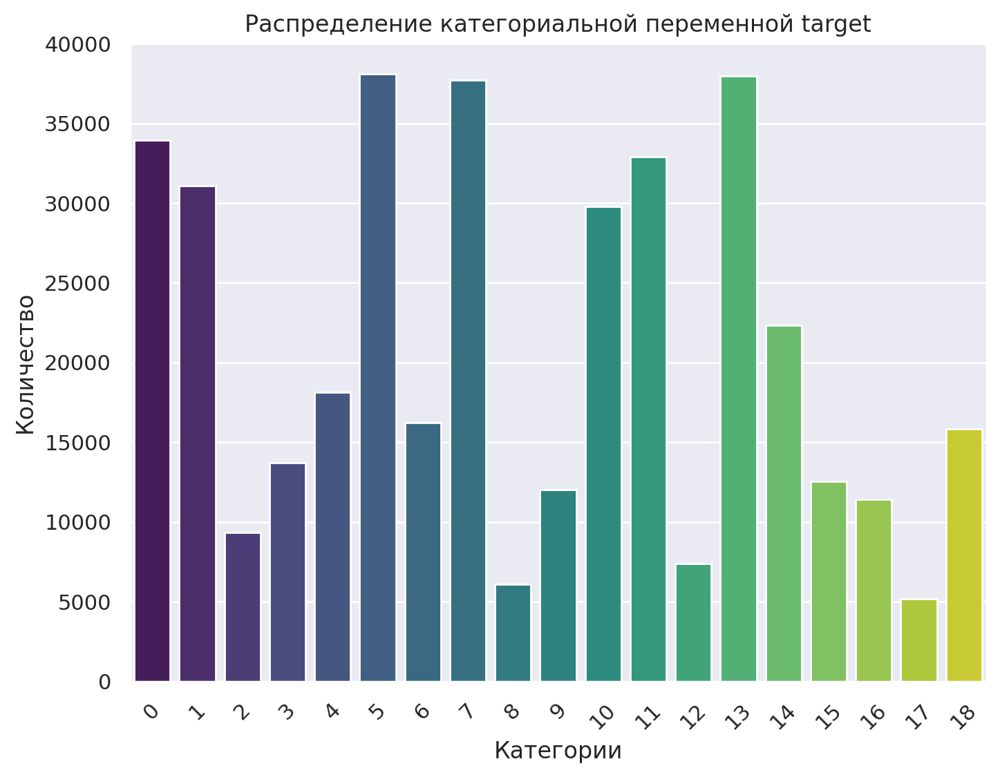

In [ ]:
target_counts = df_train['target'].value_counts()

# Построение графика
plt.figure(figsize=(8, 6))
sns.barplot(x=target_counts.index, y=target_counts.values, palette='viridis')
plt.title('Распределение категориальной переменной target')
plt.xlabel('Категории')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.show()

In [ ]:
import random
from typing import Union

def random_color() -> str:
    """Generate a random color in hex format."""
    return "#{:06x}".format(random.randint(0, 0xFFFFFF))

def show_circles_on_map(
    latitude_values: Union[np.ndarray, list],
    longitude_values: Union[np.ndarray, list],
    target_values: Union[np.ndarray, list],
) -> folium.Map:
    """
    The function draws a map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    Works best on samples of size < 10k, too costly otherwise.

    latitude_values: sample latitude values of a dataframe
    longitude_values: sample longitude values of a dataframe
    target_values: sample target values for categorization
    """

    # Создание уникальных значений категориальной переменной
    unique_targets = set(target_values)

    # Генерация случайного цвета для каждого уникального значения
    color_map = {target: random_color() for target in unique_targets}

    location = (np.mean(latitude_values), np.mean(longitude_values))
    m = folium.Map(location=location)

    # Добавляем круги на карту
    for lat, lon, target in zip(latitude_values, longitude_values, target_values):
        color = color_map[target]
        folium.Circle(
            radius=100,
            location=(lat, lon),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    # Добавляем легенду
    legend_html = '''
        <div style="position: fixed;
                    bottom: 50px; left: 50px; width: 150px; height: auto;
                    z-index:9999; font-size:14px;
                    background-color: white;
                    border: 2px solid grey;
                    border-radius: 5px;
                    padding: 10px;">
            <b>Легенда</b><br>
    '''

    for target, color in color_map.items():
        legend_html += f'<i style="background: {color}; width: 12px; height: 12px; display: inline-block; margin-right: 5px;"></i> {target}<br>'

    legend_html += '</div>'

    m.get_root().html.add_child(folium.Element(legend_html))

    return m

In [ ]:
df_train_clean = df_train.dropna(subset=['Latitude', 'Longitude','target'])
def get_latitudes_and_longitudes(df_train_clean, sample_size=5000):
    # Случайный выбор строк
    sample_df = df_train_clean.sample(sample_size)

    # Получаем координаты
    latitudes = sample_df['Latitude'].values
    longitudes = sample_df['Longitude'].values
    target_values = sample_df['target']

    return latitudes, longitudes, target_values

# Вызов функции для получения координат
latitudes, longitudes, target_values = get_latitudes_and_longitudes(df_train_clean)

m = show_circles_on_map(latitudes, longitudes, target_values)
m.save('map.html')
m

Судя по карте, в городе есть определенные неблагополучные районы, где совершается наибольшее число преступлений - на северо-востоке города. В основном преступления совершаются в жилых районах, леса и парки - скорее исключения. Также видим небольшое количество преступлений в отдаленном месте - Treasure Island. Заметим, что многие виды преступлений можно сгруппировать по сущности - например мелкие кражи и ограбления отнести к категории воровства и тд, так мы сократим количество категорий и возможно увидим больше зависимостей на карте.

In [ ]:
def categorize_crime(crime):
    if crime in [10, 17, 14]: #'Motor Vehicle Theft', 'Traffic Violation Arrest','Recovered Vehicle'
        return 'Преступления, связанные с автомобилями'
    elif crime in [5, 6, 4, 15]: #'Larceny Theft', 'Robbery','Fraud', 'Lost Property'
        return 'Материальные преступления на улицах'
    elif crime in [1, 7]: #'Malicious Mischief', 'Burglary'
        return 'Преступления, связанные с недвижимостью'
    elif crime in [0, 12, 9]: #'Assault','Offences Against The Family And Children', 'Missing Person'
        return 'Преступления против личности и личной безопасности'
    elif crime in [2, 3, 11]: #'Disorderly Conduct', 'Drug Offense','Non Criminal'
        return 'Нарушения порядка'
    else:
        return 'Прочие'

# Применяем категориальный признак
df_train['Category'] = df_train['target'].apply(categorize_crime)

df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,Latitude,Longitude,Neighborhoods,Current Supervisor Districts,Current Police Districts,target,Category
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,37.784560,-122.407337,19.0,3.0,5.0,1,"Преступления, связанные с недвижимостью"
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,37.798490,-122.407149,106.0,3.0,6.0,0,Преступления против личности и личной безопасн...
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,37.797396,-122.402887,106.0,3.0,6.0,1,"Преступления, связанные с недвижимостью"
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,37.713143,-122.433707,58.0,1.0,9.0,7,"Преступления, связанные с недвижимостью"
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,37.730658,-122.403400,91.0,9.0,2.0,3,Нарушения порядка


In [ ]:
df_train_clean = df_train.dropna(subset=['Latitude', 'Longitude','Category'])
def get_latitudes_and_longitudes(df_train_clean, sample_size=5000):
    # Случайный выбор строк
    sample_df = df_train_clean.sample(sample_size)

    # Получаем координаты
    latitudes = sample_df['Latitude'].values
    longitudes = sample_df['Longitude'].values
    target_values = sample_df['Category']

    return latitudes, longitudes, target_values

# Вызов функции для получения координат
latitudes, longitudes, target_values = get_latitudes_and_longitudes(df_train_clean)

m = show_circles_on_map(latitudes, longitudes, target_values)
m.save('map.html')
m

В нашем датасете есть пропуски в категориальных столбцах, заполним их отдельным значением.

In [ ]:
df_train = df_train.dropna(subset=['Latitude', 'Longitude','Neighborhoods'])

# Проверка результата
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Index: 366579 entries, 0 to 391749
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Unnamed: 0                    366579 non-null  int64  
 1   Row ID                        366579 non-null  int64  
 2   Incident Datetime             366579 non-null  object 
 3   Incident Day of Week          366579 non-null  object 
 4   Report Type Code              366579 non-null  object 
 5   Intersection                  366579 non-null  object 
 6   Police District               366579 non-null  object 
 7   Analysis Neighborhood         366579 non-null  object 
 8   Supervisor District           366495 non-null  float64
 9   Supervisor District 2012      366579 non-null  float64
 10  Latitude                      366579 non-null  float64
 11  Longitude                     366579 non-null  float64
 12  Neighborhoods                 366579 non-null  fl

In [ ]:
df_train = df_train.fillna('Null')

In [ ]:
df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,Latitude,Longitude,Neighborhoods,Current Supervisor Districts,Current Police Districts,target,Category
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,37.784560,-122.407337,19.0,3.0,5.0,1,"Преступления, связанные с недвижимостью"
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,37.798490,-122.407149,106.0,3.0,6.0,0,Преступления против личности и личной безопасн...
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,37.797396,-122.402887,106.0,3.0,6.0,1,"Преступления, связанные с недвижимостью"
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,37.713143,-122.433707,58.0,1.0,9.0,7,"Преступления, связанные с недвижимостью"
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,37.730658,-122.403400,91.0,9.0,2.0,3,Нарушения порядка


Изучим распределение остальных признаков:

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 366579 entries, 0 to 391749
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Unnamed: 0                    366579 non-null  int64  
 1   Row ID                        366579 non-null  int64  
 2   Incident Datetime             366579 non-null  object 
 3   Incident Day of Week          366579 non-null  object 
 4   Report Type Code              366579 non-null  object 
 5   Intersection                  366579 non-null  object 
 6   Police District               366579 non-null  object 
 7   Analysis Neighborhood         366579 non-null  object 
 8   Supervisor District           366579 non-null  object 
 9   Supervisor District 2012      366579 non-null  float64
 10  Latitude                      366579 non-null  float64
 11  Longitude                     366579 non-null  float64
 12  Neighborhoods                 366579 non-null  fl

In [ ]:
df_train['Unnamed: 0'].nunique()

366579

Столбец Unnamed: 0 дублирует индексы, не несет доп информации.

In [ ]:
df_train['Report Type Code'].unique()

array(['IS', 'II', 'VS', 'VI'], dtype=object)

Значения в этом столбце могут быть утечкой информации о целевой переменной, так как некоторые категории преступлений включают в себя влияние на жертву, а некоторые категории такие как Нарушение общественного порядка скорее будут в отчете по инциденту, чем в отчете жертвы:
* IS:
Incident Report или Investigation Summary — может обозначать отчет о происшествии или сводку расследования.
* II:
Initial Incident — может указывать на начальный отчет о происшествии, который фиксирует первичные данные.
* VS:
Victim Statement — может означать отчет или заявление жертвы, касающееся происшествия.
* VI:
Victim Information или Victim Impact — может обозначать информацию о жертве или влияние на жертву в результате происшествия.


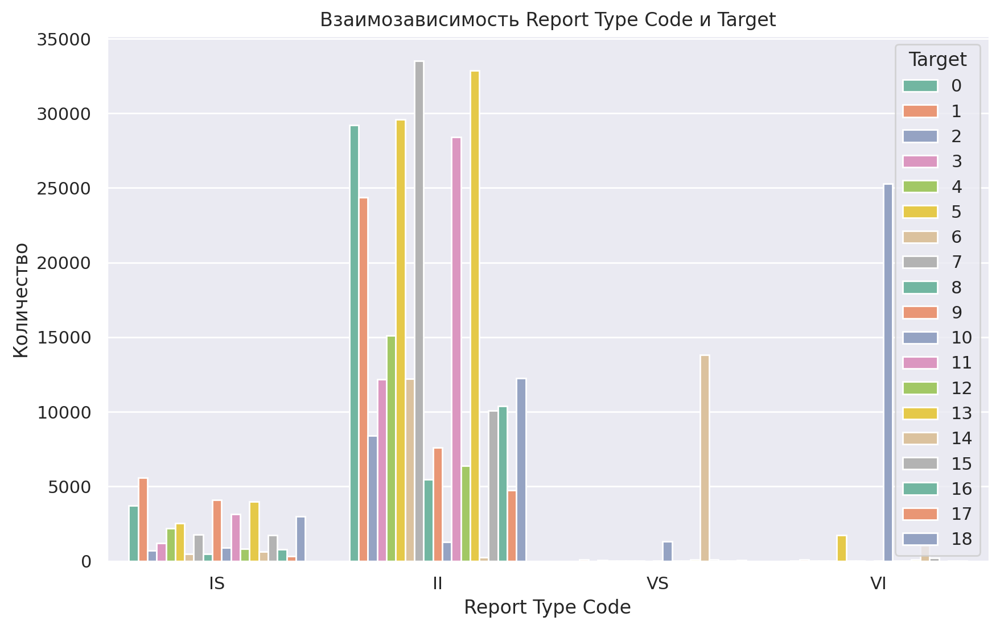

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train, x='Report Type Code', hue='target', palette='Set2')
plt.title('Взаимозависимость Report Type Code и Target')
plt.xlabel('Report Type Code')
plt.ylabel('Количество')
plt.legend(title='Target')
plt.show()

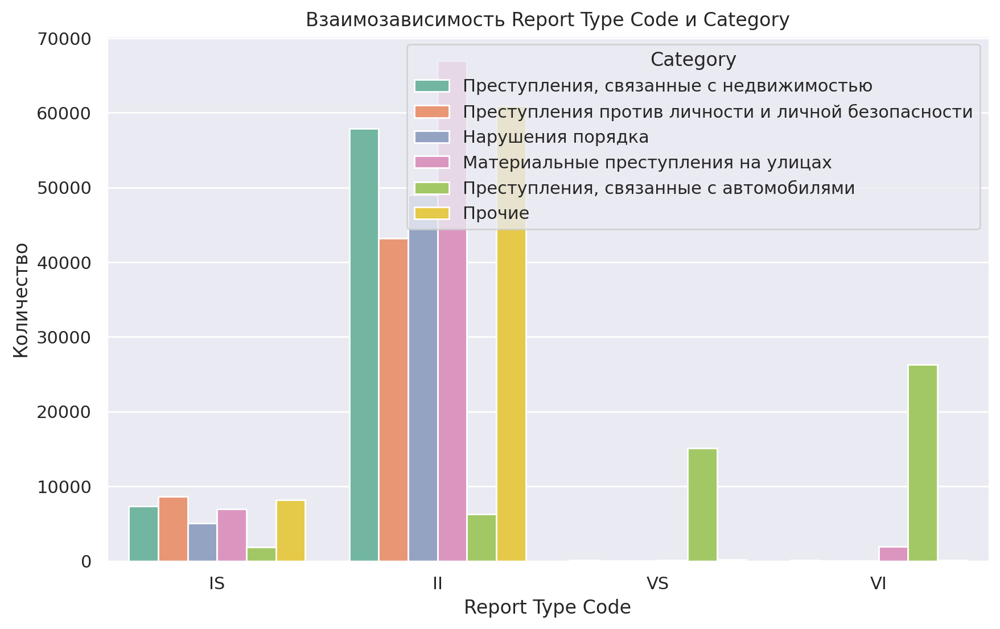

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train, x='Report Type Code', hue='Category', palette='Set2')
plt.title('Взаимозависимость Report Type Code и Category')
plt.xlabel('Report Type Code')
plt.ylabel('Количество')
plt.legend(title='Category')
plt.show()

In [ ]:
df_train['Intersection'].nunique()

6243

In [ ]:
df_train['Police District'].nunique()

11

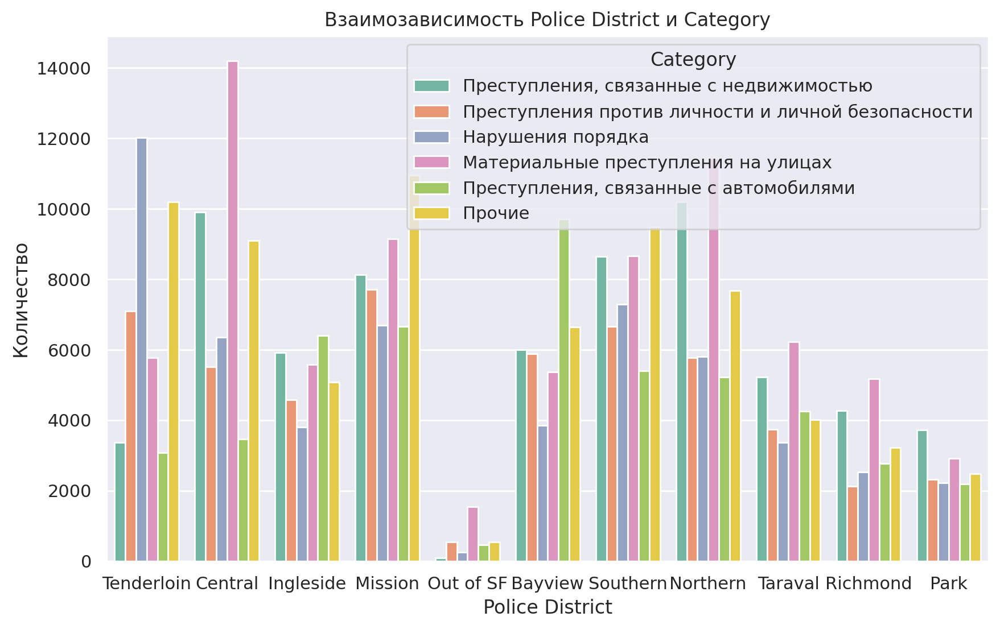

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train, x='Police District', hue='Category', palette='Set2')
plt.title('Взаимозависимость Police District и Category')
plt.xlabel('Police District')
plt.ylabel('Количество')
plt.legend(title='Category')
plt.show()

In [ ]:
df_train['Analysis Neighborhood'].nunique()

41

In [ ]:
df_train['Supervisor District'].nunique()

12

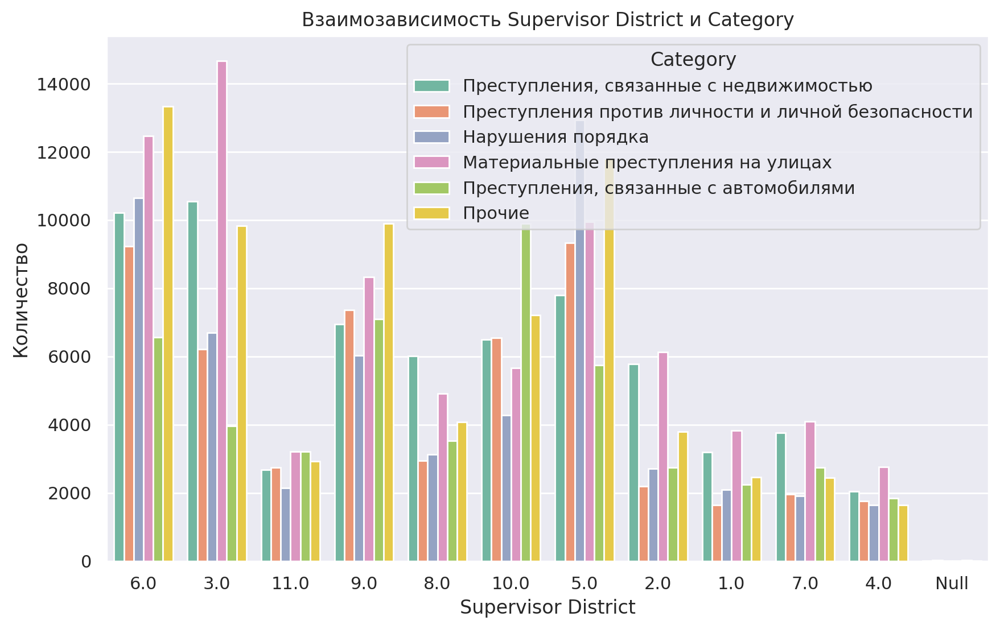

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train, x='Supervisor District', hue='Category', palette='Set2')
plt.title('Взаимозависимость Supervisor District и Category')
plt.xlabel('Supervisor District')
plt.ylabel('Количество')
plt.legend(title='Category')
plt.show()

Значения в Supervisor District примерно аналогичны значениям Police District, вероятно, можем обучать модель на одном из двух столбцов.

In [ ]:
df_train['Neighborhoods'].nunique()

116

<ipython-input-29-f1e606ca67ea>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_data = df_train.groupby(['Incident Day of Week', 'target']).size().reset_index(name='count')


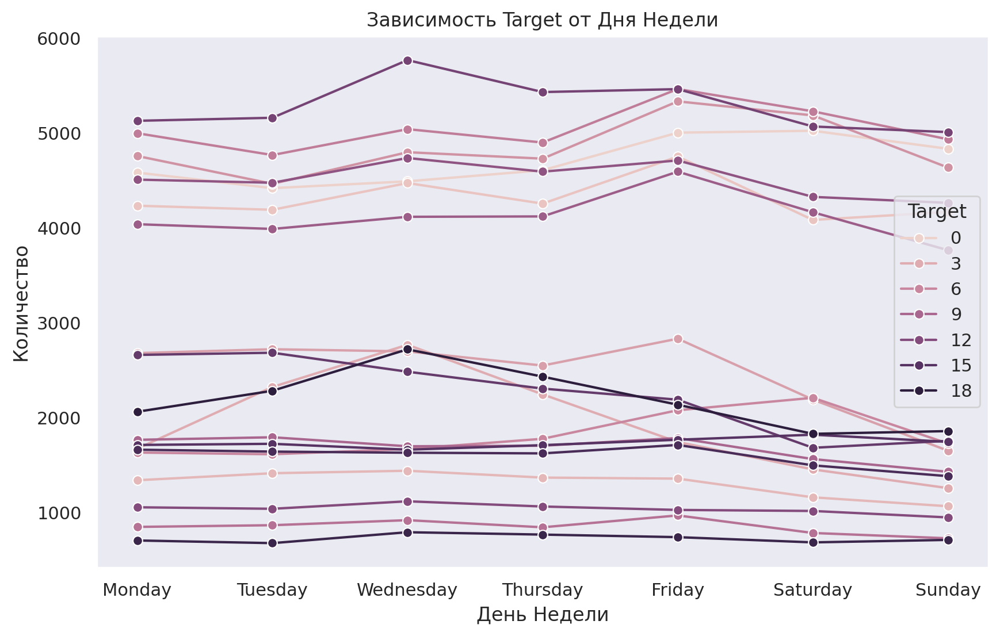

In [ ]:
# Определяем порядок дней недели
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Преобразуем переменную 'Incident Day of Week' в категориальный тип с заданным порядком
df_train['Incident Day of Week'] = pd.Categorical(df_train['Incident Day of Week'], categories=days_of_week, ordered=True)

# Подсчитываем количество инцидентов по дням недели и целевой переменной
count_data = df_train.groupby(['Incident Day of Week', 'target']).size().reset_index(name='count')

# Построение линейного графика
plt.figure(figsize=(10, 6))
sns.lineplot(data=count_data, x='Incident Day of Week', y='count', hue='target', marker='o')
plt.title('Зависимость Target от Дня Недели')
plt.xlabel('День Недели')
plt.ylabel('Количество')
plt.legend(title='Target')
plt.grid()
plt.show()

<ipython-input-30-a95c802252d7>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_data = df_train.groupby(['Incident Day of Week', 'Category']).size().reset_index(name='count')


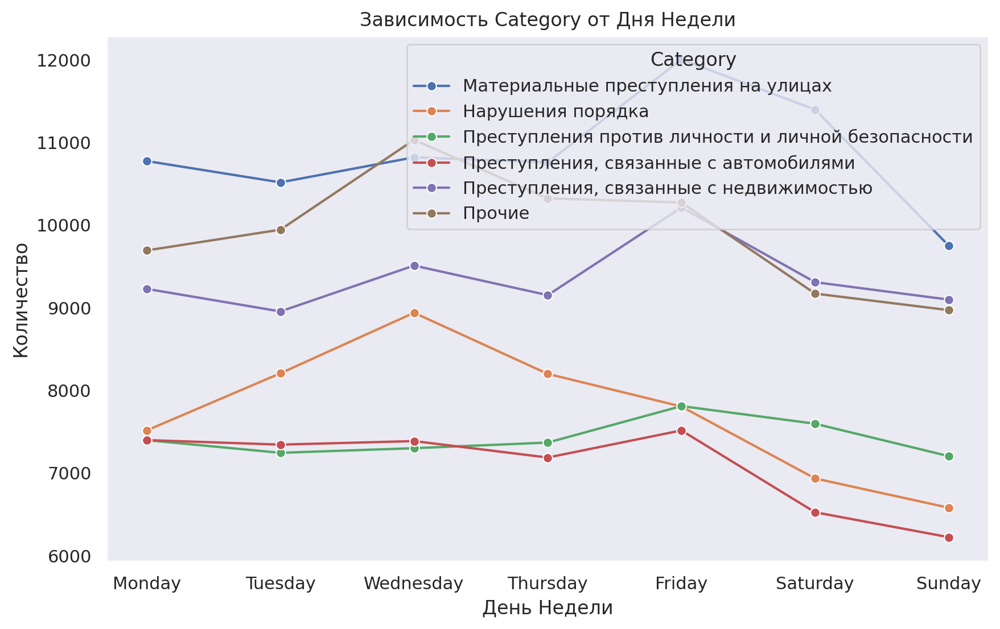

In [ ]:
# Определяем порядок дней недели
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Преобразуем переменную 'Incident Day of Week' в категориальный тип с заданным порядком
df_train['Incident Day of Week'] = pd.Categorical(df_train['Incident Day of Week'], categories=days_of_week, ordered=True)

# Подсчитываем количество инцидентов по дням недели и целевой переменной
count_data = df_train.groupby(['Incident Day of Week', 'Category']).size().reset_index(name='count')

# Построение линейного графика
plt.figure(figsize=(10, 6))
sns.lineplot(data=count_data, x='Incident Day of Week', y='count', hue='Category', marker='o')
plt.title('Зависимость Category от Дня Недели')
plt.xlabel('День Недели')
plt.ylabel('Количество')
plt.legend(title='Category')
plt.grid()
plt.show()

Посмотрим распределение преступлений в зависимости от месяца и года происшествия.

In [ ]:
# Преобразуем 'Incident Datetime' в формат datetime
df_train['Incident Datetime'] = pd.to_datetime(df_train['Incident Datetime'])

# Добавляем столбец с месяцем и годом
df_train['Month-Year'] = df_train['Incident Datetime'].dt.to_period('M')

# Для отображения результата
df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,Latitude,Longitude,Neighborhoods,Current Supervisor Districts,Current Police Districts,target,Category,Month-Year
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,37.784560,-122.407337,19.0,3.0,5.0,1,"Преступления, связанные с недвижимостью",2019-11
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,37.798490,-122.407149,106.0,3.0,6.0,0,Преступления против личности и личной безопасн...,2022-02
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,37.797396,-122.402887,106.0,3.0,6.0,1,"Преступления, связанные с недвижимостью",2019-05
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,37.713143,-122.433707,58.0,1.0,9.0,7,"Преступления, связанные с недвижимостью",2023-05
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,37.730658,-122.403400,91.0,9.0,2.0,3,Нарушения порядка,2018-10


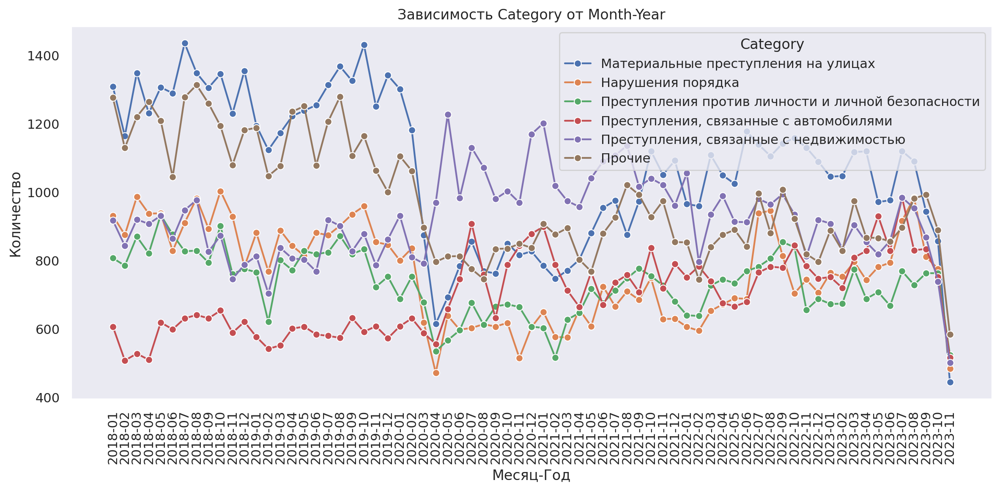

In [ ]:
# Подсчитываем количество записей для каждой категории по месяцам
count_data = df_train.groupby(['Month-Year', 'Category']).size().reset_index(name='count')

# Преобразуем 'Month-Year' обратно в строку для корректного отображения на графике
count_data['Month-Year'] = count_data['Month-Year'].astype(str)

# Построение линейного графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=count_data, x='Month-Year', y='count', hue='Category', marker='o')
plt.title('Зависимость Category от Month-Year')
plt.xlabel('Месяц-Год')
plt.ylabel('Количество')
plt.xticks(rotation=90)


plt.legend(title='Category')
plt.grid()
plt.tight_layout()  # Упаковка графика для лучшего отображения
plt.show()

В апреле 2020 года было аномально мало преступлений, что вероятно связано с ковидом и массовым локдауном.

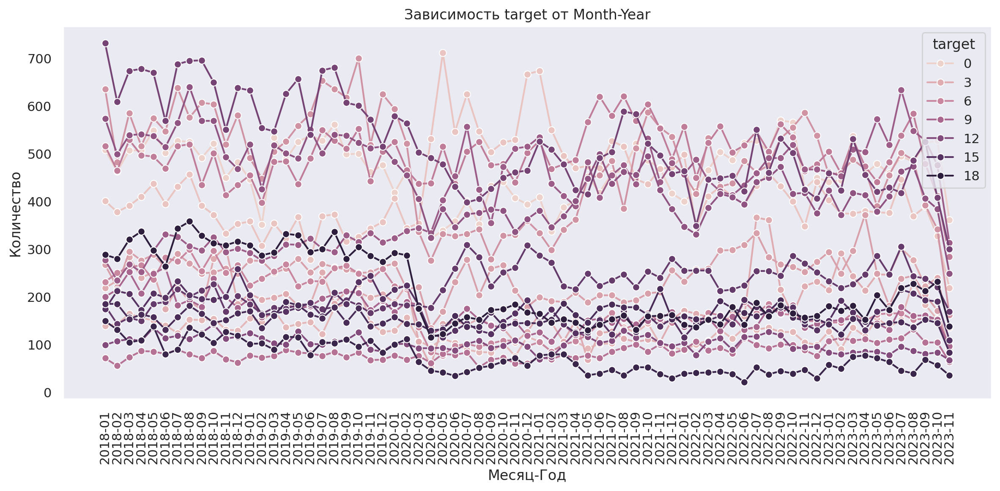

In [ ]:
# Подсчитываем количество записей для каждой категории по месяцам
count_data = df_train.groupby(['Month-Year', 'target']).size().reset_index(name='count')

# Преобразуем 'Month-Year' обратно в строку для корректного отображения на графике
count_data['Month-Year'] = count_data['Month-Year'].astype(str)

# Построение линейного графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=count_data, x='Month-Year', y='count', hue='target', marker='o')
plt.title('Зависимость target от Month-Year')
plt.xlabel('Месяц-Год')
plt.ylabel('Количество')
plt.xticks(rotation=90)


plt.legend(title='target')
plt.grid()
plt.tight_layout()  # Упаковка графика для лучшего отображения
plt.show()

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 366579 entries, 0 to 391749
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   Unnamed: 0                    366579 non-null  int64         
 1   Row ID                        366579 non-null  int64         
 2   Incident Datetime             366579 non-null  datetime64[ns]
 3   Incident Day of Week          366579 non-null  category      
 4   Report Type Code              366579 non-null  object        
 5   Intersection                  366579 non-null  object        
 6   Police District               366579 non-null  object        
 7   Analysis Neighborhood         366579 non-null  object        
 8   Supervisor District           366579 non-null  object        
 9   Supervisor District 2012      366579 non-null  float64       
 10  Latitude                      366579 non-null  float64       
 11  Longitude         

In [ ]:
!pip install phik

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 8.2 MB/s eta 0:00:00


In [ ]:
import phik

# Преобразуем все значения в выбранных столбцах в строки
df_train[['target','Supervisor District', 'Category', 'Incident Day of Week', 'Report Type Code', 'Police District', 'Analysis Neighborhood']] = df_train[['target','Supervisor District', 'Category', 'Incident Day of Week', 'Report Type Code', 'Police District', 'Analysis Neighborhood']].astype(str)

# Убедимся, что нет пропусков в данных
df_train.fillna('', inplace=True)

# Теперь создаем матрицу Phik
crime_matrix = df_train[['target','Supervisor District', 'Category', 'Incident Day of Week', 'Report Type Code', 'Police District', 'Analysis Neighborhood']].phik_matrix()

# Показать матрицу
crime_matrix

,target,Supervisor District,Category,Incident Day of Week,Report Type Code,Police District,Analysis Neighborhood
target,1.000000,0.266917,1.000000,0.071636,0.892134,0.335889,0.371658
Supervisor District,0.266917,1.000000,0.251293,0.025006,0.202769,0.908488,0.983219
Category,1.000000,0.251293,1.000000,0.031637,0.675323,0.233980,0.296413
Incident Day of Week,0.071636,0.025006,0.031637,1.000000,0.032443,0.027825,0.044046
Report Type Code,0.892134,0.202769,0.675323,0.032443,1.000000,0.177222,0.217648
Police District,0.335889,0.908488,0.233980,0.027825,0.177222,1.000000,0.970415
Analysis Neighborhood,0.371658,0.983219,0.296413,0.044046,0.217648,0.970415,1.000000


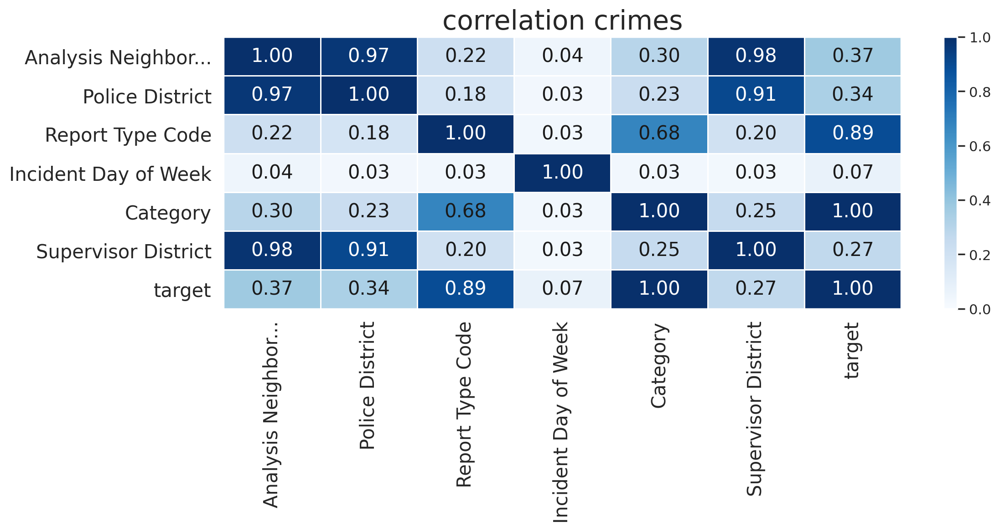

In [ ]:
from phik.report import plot_correlation_matrix

plot_correlation_matrix(crime_matrix.values, x_labels=crime_matrix.columns, y_labels=crime_matrix.index,
                        vmin=0, vmax=1, color_map='Blues', title=r'correlation crimes', fontsize_factor=1.5,
                        figsize=(12,6))
plt.tight_layout()

In [ ]:
df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,Latitude,Longitude,Neighborhoods,Current Supervisor Districts,Current Police Districts,target,Category,Month-Year
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,37.784560,-122.407337,19.0,3.0,5.0,1,"Преступления, связанные с недвижимостью",2019-11
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,37.798490,-122.407149,106.0,3.0,6.0,0,Преступления против личности и личной безопасн...,2022-02
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,37.797396,-122.402887,106.0,3.0,6.0,1,"Преступления, связанные с недвижимостью",2019-05
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,37.713143,-122.433707,58.0,1.0,9.0,7,"Преступления, связанные с недвижимостью",2023-05
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,37.730658,-122.403400,91.0,9.0,2.0,3,Нарушения порядка,2018-10


In [ ]:
df_train['Year'] = df_train['Incident Datetime'].dt.year
df_train['Month'] = df_train['Incident Datetime'].dt.month

# Удаляем столбец 'Month-Year'
df_train.drop(columns=['Month-Year'], inplace=True)

# Проверка результата
print(df_train.head())

   Unnamed: 0        Row ID   Incident Datetime Incident Day of Week  \
0           0   86814469434 2019-11-08 14:00:00               Friday   
1           1  112210668395 2022-02-15 16:30:00              Tuesday   
2           2   79810969452 2019-05-05 03:30:00               Sunday   
3           3  127781292541 2023-05-20 18:00:00             Saturday   
4           4   73242481031 2018-10-30 02:31:00              Tuesday   

  Report Type Code                                 Intersection  \
0               IS                        MARKET ST \ POWELL ST   
1               II                        FRESNO ST \ GRANT AVE   
2               IS                      OSGOOD PL \ PACIFIC AVE   
3               II     GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD   
4               IS  THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE   

  Police District           Analysis Neighborhood Supervisor District  \
0      Tenderloin  Financial District/South Beach                 6.0   
1         Central 

In [ ]:
df_train['day'] = df_train['Incident Datetime'].dt.day

In [ ]:
df_train['datetime_as_timestamp'] = df_train['Incident Datetime'].apply(lambda x: x.timestamp())

In [ ]:
def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    R = 6371.0  # Радиус Земли в километрах
    return R * c

def add_distance_to_sf(df):
    sf_lat = 37.7749  # Широта центра Сан-Франциско
    sf_lon = -122.4194  # Долгота центра Сан-Франциско

    # Вычисление расстояния и добавление нового столбца
    df['Distance_to_SF'] = df.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], sf_lat, sf_lon),
        axis=1
    )

# Пример использования с df_train
# df_train должен содержать столбцы 'Latitude' и 'Longitude'
add_distance_to_sf(df_train)

# Выводим первые строки для проверки
print(df_train[['Latitude', 'Longitude', 'Distance_to_SF']].head())


    Latitude   Longitude  Distance_to_SF
0  37.784560 -122.407337        1.509222
1  37.798490 -122.407149        2.835408
2  37.797396 -122.402887        2.891948
3  37.713143 -122.433707        6.981320
4  37.730658 -122.403400        5.116599


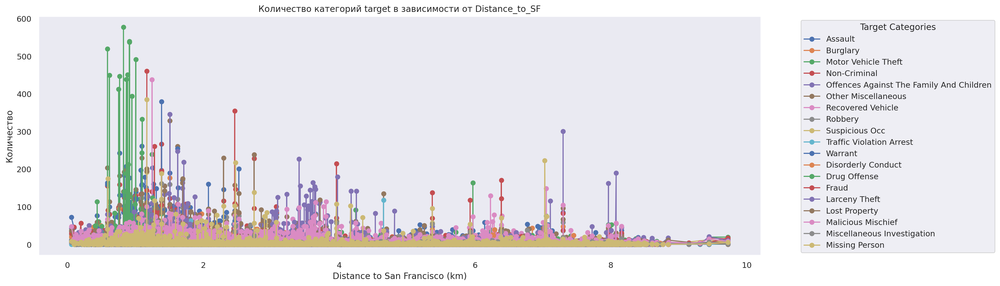

In [ ]:

# Словарь категорий
category_dict = {
    0: 'Assault',
    1: 'Burglary',
    2: 'Disorderly Conduct',
    3: 'Drug Offense',
    4: 'Fraud',
    5: 'Larceny Theft',
    6: 'Lost Property',
    7: 'Malicious Mischief',
    8: 'Miscellaneous Investigation',
    9: 'Missing Person',
    10: 'Motor Vehicle Theft',
    11: 'Non-Criminal',
    12: 'Offences Against The Family And Children',
    13: 'Other Miscellaneous',
    14: 'Recovered Vehicle',
    15: 'Robbery',
    16: 'Suspicious Occ',
    17: 'Traffic Violation Arrest',
    18: 'Warrant'
}

# Группируем данные по Distance_to_SF и target
grouped_data = df_train.groupby(['Distance_to_SF', 'target']).size().reset_index(name='count')

# Построение линейного графика
plt.figure(figsize=(18, 6))

# Для каждой категории в target создаем отдельную линию
for category in grouped_data['target'].unique():
    category_data = grouped_data[grouped_data['target'] == category]
    plt.plot(category_data['Distance_to_SF'], category_data['count'], marker='o', label=category_dict[int(category)])  # Преобразуем в int

# Настройки графика
plt.title('Количество категорий target в зависимости от Distance_to_SF')
plt.xlabel('Distance to San Francisco (km)')
plt.ylabel('Количество')
plt.legend(title='Target Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.show()

Судя по графику, существует определенная закономерность, связанная с расстоянием до центра города, добавим этот признак в нашу модель.

In [ ]:
df_train['hour'] = df_train['Incident Datetime'].dt.hour

# Вывод первых строк для проверки
print(df_train[['Incident Datetime', 'hour']].head())

    Incident Datetime  hour
0 2019-11-08 14:00:00    14
1 2022-02-15 16:30:00    16
2 2019-05-05 03:30:00     3
3 2023-05-20 18:00:00    18
4 2018-10-30 02:31:00     2


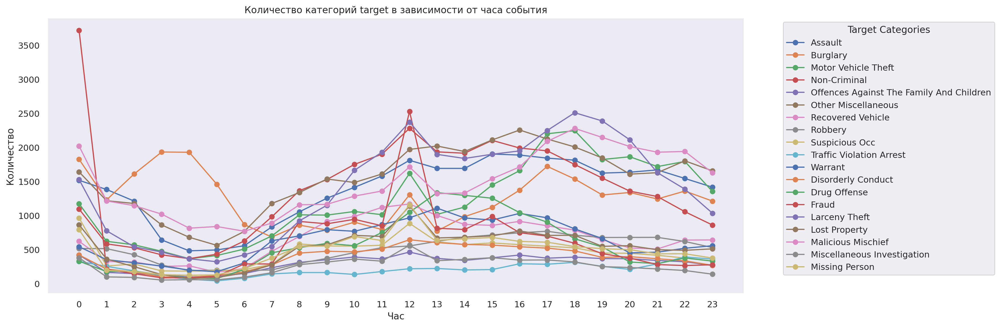

In [ ]:
# Группируем данные по hour и target
grouped_data = df_train.groupby(['hour', 'target']).size().reset_index(name='count')

# Построение линейного графика
plt.figure(figsize=(18, 6))

# Для каждой категории в target создаем отдельную линию
for category in grouped_data['target'].unique():
    category_data = grouped_data[grouped_data['target'] == category]
    plt.plot(category_data['hour'], category_data['count'], marker='o', label=category_dict[int(category)])  # Преобразуем в int

# Настройки графика
plt.title('Количество категорий target в зависимости от часа события')
plt.xlabel('Час')
plt.ylabel('Количество')
plt.legend(title='Target Categories', bbox_to_anchor=(1.05, 1), loc='upper left')  # Легенда справа
plt.grid()
plt.xticks(range(24))  # Устанавливаем метки по всем часам суток
plt.tight_layout()  # Уменьшаем отступы
plt.show()


Также существует зависимость типа преступления от часа - например, Нарушение общественного порядка, как правило, происходит в ночные часы.

In [ ]:
import holidays

# Создаем объект для праздников в США
us_holidays = holidays.US()

# Функция для проверки, является ли день праздником или выходным
def is_holiday(date):
    return date in us_holidays

# Применяем функцию к столбцу 'datetime_as_timestamp' и создаем новый столбец
df_train['is_holiday'] = df_train['datetime_as_timestamp'].apply(is_holiday)

# Проверка результата
print(df_train[['datetime_as_timestamp', 'is_holiday']].head())

   datetime_as_timestamp  is_holiday
0           1.573222e+09       False
1           1.644943e+09       False
2           1.557027e+09       False
3           1.684606e+09       False
4           1.540867e+09       False


In [ ]:
import random

# Случайно выбираем 200 строк
sampled_data = df_train.sample(n=200, random_state=42)

# Создаем карту с центром в средней точке Latitude и Longitude
map_center = [df_train['Latitude'].mean(), df_train['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Добавляем метки на карту
for idx, row in sampled_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=str(row['Neighborhoods']),
        icon=folium.Icon(color='blue')
    ).add_to(m)

m.save('map_with_neighborhoods.html')

m

In [ ]:
!pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 80.0 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.4.2
    Uninstalling networkx-3.4.2:
      Successfully uninstalled networkx-3.4.2
  Attempting uninstall: geopandas
    Found existing installation: geopandas 1.0.1
    Uninstalling geopandas-1.0.1:
      Successfully uninstalled geopandas-1.0.1


In [ ]:
import osmnx as ox
import geopandas as gpd
from shapely.geometry import Point

def load_roads_data(place):
    """Загружает данные о дорогах из указанного места."""
    G = ox.graph_from_place(place, network_type='drive')
    edges = ox.graph_to_gdfs(G, edges=True, nodes=False)
    return edges

def calculate_distances_to_nearest_road(df, roads, sample_size=1000):
    """Вычисляет расстояния до ближайшей дороги для всех точек в DataFrame."""
    # Преобразуем дороги в проекцию EPSG:3857 (метры)
    roads = roads.to_crs(epsg=3857)

    # Случайная выборка дорог
    roads_sample = roads.sample(n=min(sample_size, len(roads)), random_state=42)

    # Создаем GeoSeries для точек
    points_geo = gpd.GeoSeries(df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1), crs="EPSG:4326").to_crs(epsg=3857)

    # Находим минимальное расстояние до выбранной выборки дорог
    distances = points_geo.apply(lambda point: roads_sample.distance(point).min())

    return distances

# Загрузка данных о дорогах
place = "San Francisco, California, USA"  # Замените на нужное место
roads_data = load_roads_data(place)

# Вычисление расстояний до ближайшей дороги с ограниченной выборкой
df_train['Distance_to_nearest_road'] = calculate_distances_to_nearest_road(df_train, roads_data)

print(df_train[['Latitude', 'Longitude', 'Distance_to_nearest_road']].head())


    Latitude   Longitude  Distance_to_nearest_road
0  37.784560 -122.407337                133.624856
1  37.798490 -122.407149                205.057884
2  37.797396 -122.402887                 94.372202
3  37.713143 -122.433707                107.474985
4  37.730658 -122.403400                  0.967400


<ipython-input-50-e470ef189990>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Month-Year'] = df_filtered['date'].dt.to_period('M')


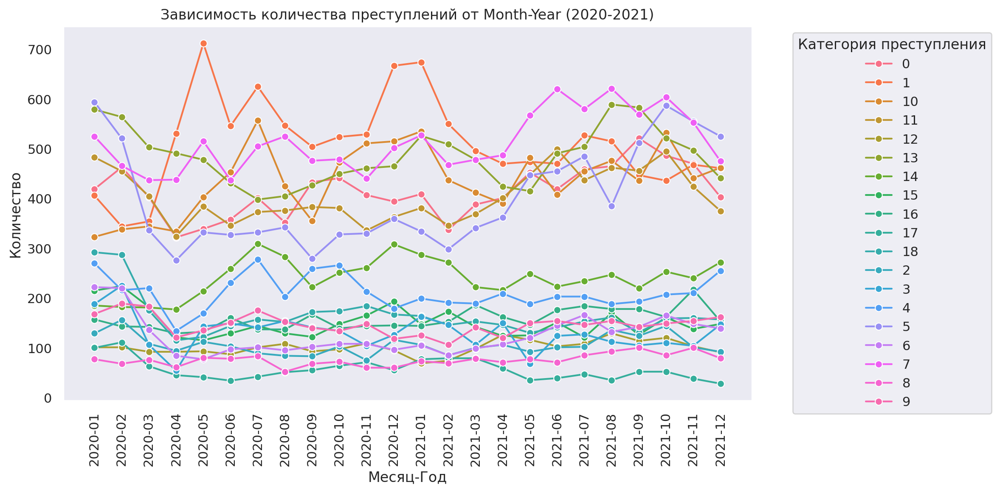

In [ ]:
# Преобразуем 'datetime_as_timestamp' в формат даты
df_train['date'] = pd.to_datetime(df_train['datetime_as_timestamp'], unit='s')

# Фильтруем данные по датам с 2020 по 2021 год
df_filtered = df_train[(df_train['date'] >= '2020-01-01') & (df_train['date'] <= '2021-12-31')]

# Создаем столбец 'Month-Year' для группировки
df_filtered['Month-Year'] = df_filtered['date'].dt.to_period('M')

# Подсчитываем количество записей для каждой категории по месяцам
count_data = df_filtered.groupby(['Month-Year', 'target']).size().reset_index(name='count')

# Преобразуем 'Month-Year' обратно в строку для корректного отображения на графике
count_data['Month-Year'] = count_data['Month-Year'].astype(str)

# Построение линейного графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=count_data, x='Month-Year', y='count', hue='target', marker='o')
plt.title('Зависимость количества преступлений от Month-Year (2020-2021)')
plt.xlabel('Месяц-Год')
plt.ylabel('Количество')
plt.xticks(rotation=90)

plt.legend(title='Категория преступления',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()  # Упаковка графика для лучшего отображения
plt.show()


In [ ]:
def add_covid_crisis_column(df):
    """Добавляет столбец, указывающий на период ковидного кризиса."""
    # Определяем начало и конец ковидного кризиса
    start_date = pd.Timestamp('2020-02-01')
    end_date = pd.Timestamp('2020-06-30')

    # Преобразуем столбец datetime_as_timestamp в формат даты
    df['date'] = pd.to_datetime(df['datetime_as_timestamp'], unit='s')

    # Создаем новый столбец 'is_covid_crisis'
    df['is_covid_crisis'] = (df['date'] >= start_date) & (df['date'] <= end_date)

    # Удаляем временный столбец, если он не нужен
    df.drop(columns=['date'], inplace=True)

    return df

# Применение функции к df_train
df_train = add_covid_crisis_column(df_train)
df_train.head()

,Unnamed: 0,Row ID,Incident Datetime,Incident Day of Week,Report Type Code,Intersection,Police District,Analysis Neighborhood,Supervisor District,Supervisor District 2012,...,Category,Year,Month,day,datetime_as_timestamp,Distance_to_SF,hour,is_holiday,Distance_to_nearest_road,is_covid_crisis
0,0,86814469434,2019-11-08 14:00:00,Friday,IS,MARKET ST \ POWELL ST,Tenderloin,Financial District/South Beach,6.0,3.0,...,"Преступления, связанные с недвижимостью",2019,11,8,1.573222e+09,1.509222,14,False,133.624856,False
1,1,112210668395,2022-02-15 16:30:00,Tuesday,II,FRESNO ST \ GRANT AVE,Central,North Beach,3.0,3.0,...,Преступления против личности и личной безопасн...,2022,2,15,1.644943e+09,2.835408,16,False,205.057884,False
2,2,79810969452,2019-05-05 03:30:00,Sunday,IS,OSGOOD PL \ PACIFIC AVE,Central,North Beach,3.0,3.0,...,"Преступления, связанные с недвижимостью",2019,5,5,1.557027e+09,2.891948,3,False,94.372202,False
3,3,127781292541,2023-05-20 18:00:00,Saturday,II,GENEVA AVE \ MOSCOW ST \ SOUTH HILL BLVD,Ingleside,Excelsior,11.0,11.0,...,"Преступления, связанные с недвижимостью",2023,5,20,1.684606e+09,6.981320,18,False,107.474985,False
4,4,73242481031,2018-10-30 02:31:00,Tuesday,IS,THORNTON AVE \ BAY SHORE BLVD \ CARROLL AVE,Ingleside,Portola,9.0,10.0,...,Нарушения порядка,2018,10,30,1.540867e+09,5.116599,2,False,0.967400,False


In [ ]:
import geopandas as gpd

# Загрузка данных о землепользовании с обработкой ошибок
try:
    landuse_data = pd.read_csv('San_Francisco_Land_Use_-_2023_20241102-2.csv', nrows=114000) #данные из открытого источника 'https://data.sfgov.org/api/views/k8rg-ihdq/rows.csv?accessType=DOWNLOAD'

    # Преобразование 'the_geom' в геометрические объекты
    landuse_data['the_geom'] = landuse_data['the_geom'].apply(lambda x: gpd.GeoSeries.from_wkt([x])[0])

    # Создание GeoDataFrame
    landuse_gdf = gpd.GeoDataFrame(landuse_data, geometry='the_geom')
    landuse_gdf.set_crs(epsg=4326, inplace=True)  # Установка системы координат

    # Извлечение координат для новых столбцов
    landuse_gdf['longitude'] = landuse_gdf['the_geom'].apply(lambda geom: geom.representative_point().x)
    landuse_gdf['latitude'] = landuse_gdf['the_geom'].apply(lambda geom: geom.representative_point().y)

    # Проверка результата
    print(landuse_gdf[['the_geom', 'longitude', 'latitude']].head())
except Exception as e:
    print(f"Ошибка при загрузке файла: {e}")


                                            the_geom   longitude   latitude
0  MULTIPOLYGON (((-122.44480 37.77550, -122.4450... -122.444937  37.775523
1  MULTIPOLYGON (((-122.44478 37.77543, -122.4450... -122.444929  37.775445
2  MULTIPOLYGON (((-122.44477 37.77536, -122.4450... -122.444922  37.775378
3  MULTIPOLYGON (((-122.44507 37.77512, -122.4450... -122.444900  37.775177
4  MULTIPOLYGON (((-122.44507 37.77512, -122.4451... -122.445121  37.775291


In [ ]:
from shapely.geometry import Point
from sklearn.neighbors import NearestNeighbors

# Создание GeoDataFrame для df_train
df_train_geo = gpd.GeoDataFrame(df_train, geometry=gpd.points_from_xy(df_train['Longitude'], df_train['Latitude']))
df_train_geo.set_crs(epsg=4326, inplace=True)

# Получение центроидов геометрий в landuse_gdf
landuse_gdf['centroid'] = landuse_gdf.geometry.centroid
landuse_coords = np.array(list(zip(landuse_gdf.centroid.x, landuse_gdf.centroid.y)))

# Создание модели Nearest Neighbors
nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(landuse_coords)

# Поиск ближайших соседей для каждой точки в df_train
distances, indices = nbrs.kneighbors(np.array(list(zip(df_train['Longitude'], df_train['Latitude']))))

# Добавление столбцов с ближайшими значениями в df_train
df_train['landuse'] = landuse_gdf.iloc[indices.flatten()]['landuse'].values
df_train['restype'] = landuse_gdf.iloc[indices.flatten()]['restype'].values
df_train['res'] = landuse_gdf.iloc[indices.flatten()]['res'].values

df_train['res'] = df_train['res'].str.replace(',', '').astype(float)

print(df_train[['Latitude', 'Longitude', 'landuse', 'restype','res']].head())


<ipython-input-53-d32610cda9f1>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  landuse_gdf['centroid'] = landuse_gdf.geometry.centroid
<ipython-input-53-d32610cda9f1>:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  landuse_coords = np.array(list(zip(landuse_gdf.centroid.x, landuse_gdf.centroid.y)))


    Latitude   Longitude     landuse restype     res
0  37.784560 -122.407337  RETAIL/ENT     NaN     0.0
1  37.798490 -122.407149        MIPS     NaN     0.0
2  37.797396 -122.402887        MIPS     NaN     0.0
3  37.713143 -122.433707    RESIDENT  SINGLE  2082.0
4  37.730658 -122.403400      VACANT     NaN     0.0


In [ ]:
landuse_data.head()

,the_geom,mapblklot,restype,res,total,cie,med,mips,retail,pdr,visitor,resunits,landuse,from_st,to_st,street,st_type
0,MULTIPOLYGON (((-122.44479559892035 37.7754955...,1186006,FLATS,"2,800",0,0,0,0,0,0,0,3,RESIDENT,633.0,635.0,CENTRAL,AVE
1,MULTIPOLYGON (((-122.44478227667813 37.7754292...,1186007,FLATS,"2,932",0,0,0,0,0,0,0,2,RESIDENT,625.0,627.0,CENTRAL,AVE
2,MULTIPOLYGON (((-122.44476896731837 37.7753630...,1186007A,FLATS,"3,004",0,0,0,0,0,0,0,2,RESIDENT,619.0,621.0,CENTRAL,AVE
3,MULTIPOLYGON (((-122.44506900454533 37.7751211...,1186008,APTS,"5,730","1,666",0,0,"1,666",0,0,0,7,MIXRES,1706.0,1706.0,GROVE,ST
4,MULTIPOLYGON (((-122.44506900454533 37.7751211...,1186009,APTS,"4,360",0,0,0,0,0,0,0,6,RESIDENT,1726.0,1726.0,GROVE,ST


In [ ]:
landuse_data_2020 = pd.read_csv('San_Francisco_Land_Use_-_2020_20241102.csv') #данные из открытого источника 'https://data.sfgov.org/api/views/k8rg-ihdq/rows.csv?accessType=DOWNLOAD'

# Преобразование 'the_geom' в геометрические объекты
landuse_data_2020['the_geom'] = landuse_data_2020['the_geom'].apply(lambda x: gpd.GeoSeries.from_wkt([x])[0])

# Создание GeoDataFrame
landuse_gdf_2020 = gpd.GeoDataFrame(landuse_data_2020, geometry='the_geom')
landuse_gdf_2020.set_crs(epsg=4326, inplace=True)  # Установка системы координат

# Извлечение координат для новых столбцов
landuse_gdf_2020['longitude'] = landuse_gdf_2020['the_geom'].apply(lambda geom: geom.representative_point().x)
landuse_gdf_2020['latitude'] = landuse_gdf_2020['the_geom'].apply(lambda geom: geom.representative_point().y)

# Проверка результата
print(landuse_gdf_2020[['the_geom', 'longitude', 'latitude']].head())


<ipython-input-55-61ee6ec4dc66>:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  landuse_data_2020 = pd.read_csv('San_Francisco_Land_Use_-_2020_20241102.csv') #данные из открытого источника 'https://data.sfgov.org/api/views/k8rg-ihdq/rows.csv?accessType=DOWNLOAD'


                                            the_geom   longitude   latitude
0  MULTIPOLYGON (((-122.41912 37.80578, -122.4188... -122.418959  37.805760
1  MULTIPOLYGON (((-122.41923 37.80546, -122.4192... -122.419000  37.805529
2  MULTIPOLYGON (((-122.41921 37.80539, -122.4192... -122.418985  37.805454
3  MULTIPOLYGON (((-122.41908 37.80556, -122.4190... -122.418930  37.805615
4  MULTIPOLYGON (((-122.41909 37.80563, -122.4191... -122.418943  37.805682


In [ ]:
landuse_gdf_2020.head()

,the_geom,bldgsqft,blklot,block_num,cie,from_st,landuse,landval,lot_num,mapblklot,...,st_type,street,strucval,to_st,total_uses,usetype,visitor,yrbuilt,longitude,latitude
0,"MULTIPOLYGON (((-122.41912 37.80578, -122.4188...","4,871",0027001,27,0,715,RESIDENT,"1,905,896",001,0027001,...,ST,NORTH POINT,"1,270,596",NaN,0,F,0,"1,950",-122.418959,37.805760
1,"MULTIPOLYGON (((-122.41923 37.80546, -122.4192...","3,480",0027001A,27,0,2647,RESIDENT,"1,886,135",001A,0027001A,...,ST,LEAVENWORTH,"1,617,722",NaN,"2,128",F,0,"1,934",-122.419000,37.805529
2,"MULTIPOLYGON (((-122.41921 37.80539, -122.4192...","3,370",0027001B,27,0,2639,RESIDENT,"413,338",001B,0027001B,...,ST,LEAVENWORTH,"373,460",NaN,0,F,0,"1,940",-122.418985,37.805454
3,"MULTIPOLYGON (((-122.41908 37.80556, -122.4190...","3,230",0027001C,27,0,2653,RESIDENT,"69,216",001C,0027001C,...,ST,LEAVENWORTH,"108,003",NaN,0,F,0,"1,950",-122.418930,37.805615
4,"MULTIPOLYGON (((-122.41909 37.80563, -122.4191...","3,273",0027001D,27,0,2659,RESIDENT,"437,992",001D,0027001D,...,ST,LEAVENWORTH,"420,740",NaN,0,F,0,"1,950",-122.418943,37.805682


In [ ]:
# Получение центроидов геометрий в landuse_gdf
landuse_gdf_2020['centroid'] = landuse_gdf_2020.geometry.centroid
landuse_coords_2020 = np.array(list(zip(landuse_gdf_2020.centroid.x, landuse_gdf_2020.centroid.y)))

# Создание модели Nearest Neighbors
nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(landuse_coords_2020)

# Поиск ближайших соседей для каждой точки в df_train
distances, indices = nbrs.kneighbors(np.array(list(zip(df_train['Longitude'], df_train['Latitude']))))

# Добавление столбцов с ближайшими значениями в df_train
df_train['landval'] = landuse_gdf_2020.iloc[indices.flatten()]['landval'].values
df_train['strucval'] = landuse_gdf_2020.iloc[indices.flatten()]['strucval'].values

df_train['landval'] = df_train['landval'].str.replace(',', '').astype(float)
df_train['strucval'] = df_train['strucval'].str.replace(',', '').astype(float)

print(df_train[['Latitude', 'Longitude', 'strucval', 'landval']].head())


<ipython-input-57-e8403045f2c4>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  landuse_gdf_2020['centroid'] = landuse_gdf_2020.geometry.centroid
<ipython-input-57-e8403045f2c4>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  landuse_coords_2020 = np.array(list(zip(landuse_gdf_2020.centroid.x, landuse_gdf_2020.centroid.y)))


    Latitude   Longitude    strucval     landval
0  37.784560 -122.407337  36031167.0  17096690.0
1  37.798490 -122.407149    343545.0    185650.0
2  37.797396 -122.402887   1385287.0   1962493.0
3  37.713143 -122.433707    269346.0    628477.0
4  37.730658 -122.403400         0.0         0.0


In [ ]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, log_loss
import numpy as np
import warnings

# Игнорирование предупреждений
warnings.filterwarnings("ignore", category=UserWarning)

# 1. Подготовка данных
df_train = df_train.fillna('')

# Если возможно, используйте случайную выборку для уменьшения объема данных
df_train_sample = df_train.sample(frac=0.5, random_state=42)

X_numeric = df_train_sample[['Latitude','Longitude','day','datetime_as_timestamp','Distance_to_SF','hour','Distance_to_nearest_road','res','strucval','landval']]
X_categorical = df_train_sample[['Incident Day of Week', 'Report Type Code',
                                   'Police District', 'Analysis Neighborhood', 'Year', 'Month','is_holiday','Supervisor District','Neighborhoods','is_covid_crisis','restype','landuse']]

y = df_train_sample['target']

# Кодирование и масштабирование
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_categorical_encoded = encoder.fit_transform(X_categorical)

scaler = StandardScaler()
X_numeric_scaled = scaler.fit_transform(X_numeric)

X = np.hstack((X_numeric_scaled, X_categorical_encoded))

# 2. Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Подбор гиперпараметров с использованием RandomizedSearchCV
param_dist = {
    'C': np.logspace(-4, 4, 5),
    'solver': ['lbfgs'],  # Используем только один алгоритм
}

# Ограничиваем число итераций до 5 и уменьшаем количество фолдов до 3
random_search = RandomizedSearchCV(LogisticRegression(max_iter=200),
                                   param_distributions=param_dist,
                                   n_iter=5,
                                   cv=3,
                                   scoring='neg_log_loss',
                                   random_state=42,
                                   n_jobs=-1)  # Используем все доступные ядра

random_search.fit(X_train, y_train)

# 4. Оценка лучшей модели
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)

print("Best Hyperparameters:", random_search.best_params_)
print(classification_report(y_test, y_pred, zero_division=0))
print(f'Log Loss: {log_loss(y_test, y_pred_proba)}')


Best Hyperparameters: {'solver': 'lbfgs', 'C': 1.0}
              precision    recall  f1-score   support

           0       0.15      0.23      0.19      3281
           1       0.21      0.33      0.26      2992
          10       0.89      0.88      0.88      2880
          11       0.16      0.12      0.14      3187
          12       0.00      0.00      0.00       731
          13       0.16      0.23      0.19      3682
          14       0.89      0.88      0.89      1575
          15       0.18      0.00      0.01      1220
          16       0.00      0.00      0.00      1119
          17       0.50      0.01      0.01       513
          18       0.15      0.04      0.06      1535
           2       0.33      0.00      0.00       896
           3       0.27      0.50      0.35      1354
           4       0.21      0.10      0.14      1735
           5       0.23      0.34      0.27      3362
           6       0.32      0.03      0.05      1272
           7       0.15      